# Spatial mapping of cell types across the mouse brain (2/3) - cell2location

This notebook demonstrates how to use the **cell2location** model for mapping a single cell reference cell types onto a spatial transcriptomic dataset. Here, we use a 10X single nucleus RNA-sequencing (snRNAseq) and Visium spatial transcriptomic data generated from adjacent tissue sections of the mouse brain ([Kleshchevnikov et al., BioRxiv 2020](https://www.biorxiv.org/content/10.1101/2020.11.15.378125v1)). 

The first step of our model (#2 in Fig 1, tutorial 1/3) is to estimate reference cell type signatures from scRNA-seq profiles, for example as obtained using conventional clustering to identify cell types and subpopulations followed by estimation of average cluster gene expression profiles ([Suppl. Methods, Section 2](https://github.com/vitkl/cell2location_paper/blob/master/paper/Supplementary_Methods_cell2location.pdf), [Fig S1](https://github.com/vitkl/cell2location_paper/blob/master/paper/FigS1_cell2location_workflow.pdf)). Cell2location implements this estimation step based on Negative Binomial regression, which allows to robustly combine data across technologies and batches ([Suppl. Methods, Section 2](https://github.com/vitkl/cell2location_paper/blob/master/paper/Supplementary_Methods_cell2location.pdf)).

![Figure 1.](../images/Fig1_v2.png)  
***Figure 1.*** *Overview of the spatial mapping approach and the workflow which are enabled by cell2location. From left to right: Single-cell RNA-seq and spatial transcriptomics profiles are generated from the same tissue (1). Cell2location takes reference cell type signatures derived from scRNA-seq and spatial transcriptomics data as input (2, 3). The model then decomposes spatially resolved multi-cell RNA counts matrices into the reference signatures, thereby establishing a spatial mapping of cell types (4).*


In the second step covered by this notebook (#4 in Fig 1), cell2location decomposes mRNA counts in spatial transcriptomic data using these reference signatures, thereby estimating the relative and absolute abundance of each cell type at each spatial location ([Suppl. Methods, Section 1](https://github.com/vitkl/cell2location_paper/blob/master/paper/Supplementary_Methods_cell2location.pdf), [Fig S1](https://github.com/vitkl/cell2location_paper/blob/master/paper/FigS1_cell2location_workflow.pdf)). 

## Outline

The [**cell2location** workflow](https://github.com/vitkl/cell2location_paper/blob/master/paper/FigS1_cell2location_workflow.pdf) consists of three sections:

I. Estimating reference expression signatures of cell types (1/3)

II. Spatially mapping cell types (2/3, this notebook):

1. [Loading Visium data, QC](#1.-Loading-Visium-data)
2. [Visualise Visium data in spatial 2D and UMAP coordinates](#2.-Visualise-Visium-data-in-spatial-2D-and-UMAP-coordinates)
3. [Load reference cell type signature from snRNA-seq data and show UMAP of cells](#3.-Load-reference-cell-type-signature-from-snRNA-seq-data-and-show-UMAP-of-cells)
4. [Cell2location model description and analysis pipeline](#4.-Cell2location-model-description-and-analysis-pipeline),
[Evaluating training](#Evaluating-training)

III. Results and downstream analysis (3/3)


## Loading packages and setting up GPU

First, we need to load the relevant packages and tell cell2location to use the GPU. cell2location is written in pymc3 language for probabilistic modelling that uses a deep learning library called theano for heavy computations. While the package works on both GPU and CPU, using the GPU significantly shortens the computation time for 10X Visium datasets. Using the CPU is more feasible for smaller datasets with fewer spatial locations (e.g. Nanostring WTA technology). 

In [1]:
import sys

#if branch is stable, will install via pypi, else will install from source
#branch = "pyro-cell2location"
#user = "vitkl"
#IN_COLAB = "google.colab" in sys.modules

#if IN_COLAB and branch == "stable":
#    !pip install --quiet scvi-tools[tutorials]
#elif IN_COLAB and branch != "stable":
#    !pip install --quiet --upgrade jsonschema
#    !pip install --quiet git+https://github.com/$user/scvi-tools@$branch#egg=scvi-tools[tutorials]
        
#import sys
#if not IN_COLAB:
sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/BayraktarLab/scvi-tools/')

import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib as mpl

#import cell2location
import scvi

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
import seaborn as sns

/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pytorch_lightning/metrics/__init__.py:44: LightningDeprecationWarning: `pytorch_lightning.metrics.*` module has been renamed to `torchmetrics.*` and split off to its own package (https://github.com/PyTorchLightning/metrics) since v1.3 and will be removed in v1.5
  "`pytorch_lightning.metrics.*` module has been renamed to `torchmetrics.*` and split off to its own package"


**Tips on initializing GPU** 
`THEANO_FLAGS='force_device=True'` forces the package to use GPU. Pay attention to error messages that might indicate theano failed to initalise the GPU. E.g. failure to use cuDNN will lead to significant slowdown.       

Above you should see a message similar to this confirming that `theano` started using the GPU:
```
/lib/python3.7/site-packages/theano/gpuarray/dnn.py:184: UserWarning: Your cuDNN version is more recent than Theano. If you encounter problems, try updating Theano or downgrading cuDNN to a version >= v5 and <= v7.
  warnings.warn("Your cuDNN version is more recent than "
Using cuDNN version 7605 on context None
Mapped name None to device cuda0: Tesla V100-SXM2-32GB (0000:89:00.0)
```

Do not forget to change `device=cuda0` to your available GPU id. Use `device=cuda` / `device=cuda0` if you have just one locally or if you are requesting one GPU via HPC cluster job. You can see availlable GPU by openning a terminal in jupyter and running `nvidia-smi`. 

## 1. Loading Visium data <a name="1.-Loading-Visium-data"></a>

In this tutorial, we use a paired Visium and snRNAseq reference dataset of the mouse brain (i.e. generated from adjacent tissue sections). There are two biological replicates and several tissue sections from each brain, totalling 5 10X visium samples. 

First, we need to download and unzip spatial data, as well as download estimated signatures of reference cell types, from our data portal:

In [18]:
# Set paths to data and results used through the document:
sp_data_folder = '/nfs/team205/vk7/sanger_projects/large_data/gut_kj_re/oxford_visium/'
sc_data_folder = '/nfs/team205/vk7/sanger_projects/large_data/gut_kj_re/'
results_folder = '/nfs/team205/vk7/sanger_projects/collaborations/fetal_gut_mapping/results/oxford/'
sc_results_folder = '/nfs/team205/vk7/sanger_projects/collaborations/fetal_gut_mapping/results/'
annotations_folder = '/nfs/team205/vk7/sanger_projects/collaborations/fetal_gut_mapping/results/tissue_annotation/oxford/'

regression_model_output = 'amortised_signatures_lr0002_clip_norm10'
reg_path = f'{sc_results_folder}regression_model/{regression_model_output}/'

Now, let's read the spatial Visium data from the 10X Space Ranger output and examine several QC plots. Here, we load the our Visium mouse brain experiments (i.e. sections) and corresponding histology images into a single anndata object `adata`.

In [3]:
def read_and_qc(sample_name, path=sp_data_folder):
    r""" This function reads the data for one 10X spatial experiment into the anndata object.
    It also calculates QC metrics. Modify this function if required by your workflow.
    
    :param sample_name: Name of the sample
    :param path: path to data
    """
    
    adata = sc.read_visium(path + str(sample_name),
                           count_file='filtered_feature_bc_matrix.h5', load_images=True)
    adata.obs['sample'] = sample_name
    adata.var['SYMBOL'] = adata.var_names
    adata.var.rename(columns={'gene_ids': 'ENSEMBL'}, inplace=True)
    adata.var_names = adata.var['ENSEMBL']
    adata.var.drop(columns='ENSEMBL', inplace=True)

    # Calculate QC metrics
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    adata.var['mt'] = [gene.startswith('mt-') for gene in adata.var['SYMBOL']]
    adata.obs['mt_frac'] = adata[:, adata.var['mt'].tolist()].X.sum(1).A.squeeze()/adata.obs['total_counts']

    # add sample name to obs names
    adata.obs["sample"] = [str(i) for i in adata.obs['sample']]
    adata.obs_names = adata.obs["sample"] \
                          + '_' + adata.obs_names
    adata.obs.index.name = 'spot_id'
    
    return adata

def select_slide(adata, s, s_col='sample'):
    r""" This function selects the data for one slide from the spatial anndata object.
    
    :param adata: Anndata object with multiple spatial experiments
    :param s: name of selected experiment
    :param s_col: column in adata.obs listing experiment name for each location
    """
    
    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}
    
    return slide

#######################
# Read the list of spatial experiments
sample_data = pd.DataFrame(['A1', 'A2'], 
                           columns=['sample_name'])

# Read the data into anndata objects
slides = []
for i in sample_data['sample_name']:
    slides.append(read_and_qc(i, path=sp_data_folder))

# Combine anndata objects together
adata = slides[0].concatenate(
    slides[1:],
    batch_key="sample",
    uns_merge="unique",
    batch_categories=sample_data['sample_name'],
    index_unique=None
)
#######################

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


<div class="alert alert-block alert-danger">
<b>Note!</b>
Mitochondia-encoded genes (gene names start with prefix mt- or MT-) are irrelevant for spatial mapping because their expression represents technical artifacts in the single cell and nucleus data rather than biological abundance of mitochondria. Yet these genes compose 15-40% of mRNA in each location. Hence, to avoid mapping artifacts we strongly recommend removing mitochondrial genes.
</div>

In [4]:
# mitochondria-encoded (MT) genes should be removed for spatial mapping
adata.obsm['mt'] = adata[:, adata.var['mt'].values].X.toarray()
adata = adata[:, ~adata.var['mt'].values]

/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [5]:
# read histology-based annotations:
adata.obs['Annotation'] = ''

for s in adata.obs['sample'].unique():
    annot_ = pd.read_csv(f'{annotations_folder}{s}_annotation.csv', index_col='Barcode')
    annot_.index = [f'{s}_{i}' for i in annot_.index]
    
    adata.obs.loc[annot_.index, 'Annotation'] = annot_['Annotation']
    
adata.obs['Annotation'].value_counts(dropna=False)

Trying to set attribute `.obs` of view, copying.


Epithelial            1752
Other_tissue          1649
NaN                    596
LowQ_tissue            527
Stem_cell_zone         396
Lymphoid_structure      45
Name: Annotation, dtype: int64

In [6]:
# select locations from good quality tissue:
tissue_ind = adata.obs['Annotation'].isin(['Stem_cell_zone', 'Epithelial',
                                           'Other_tissue', 'Lymphoid_structure'])
print(sum(tissue_ind))

adata = adata[tissue_ind, :]
adata.obs['Annotation'].value_counts(dropna=False)

3842


Epithelial            1752
Other_tissue          1649
Stem_cell_zone         396
Lymphoid_structure      45
Name: Annotation, dtype: int64

### Look at QC metrics

Now let's look at QC: total number of counts and total number of genes per location across Visium experiments.

Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated funct

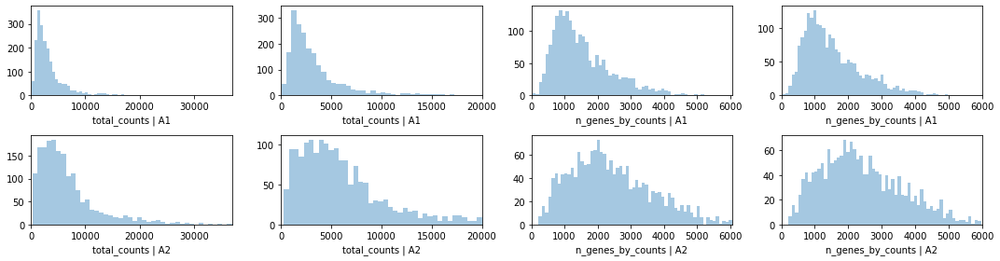

In [7]:
# PLOT QC FOR EACH SAMPLE 
fig, axs = plt.subplots(len(slides), 4, figsize=(15, 4*len(slides)-4))
for i, s in enumerate(adata.obs['sample'].unique()):
    #fig.suptitle('Covariates for filtering')
    
    slide = select_slide(adata, s)
    sns.distplot(slide.obs['total_counts'], 
                 kde=False, ax = axs[i, 0])
    axs[i, 0].set_xlim(0, adata.obs['total_counts'].max())
    axs[i, 0].set_xlabel(f'total_counts | {s}')
    
    sns.distplot(slide.obs['total_counts']\
                 [slide.obs['total_counts']<20000],
                 kde=False, bins=40, ax = axs[i, 1])
    axs[i, 1].set_xlim(0, 20000)
    axs[i, 1].set_xlabel(f'total_counts | {s}')
    
    sns.distplot(slide.obs['n_genes_by_counts'],
                 kde=False, bins=60, ax = axs[i, 2])
    axs[i, 2].set_xlim(0, adata.obs['n_genes_by_counts'].max())
    axs[i, 2].set_xlabel(f'n_genes_by_counts | {s}')
    
    sns.distplot(slide.obs['n_genes_by_counts']\
                 [slide.obs['n_genes_by_counts']<6000],
                 kde=False, bins=60, ax = axs[i, 3])
    axs[i, 3].set_xlim(0, 6000)
    axs[i, 3].set_xlabel(f'n_genes_by_counts | {s}')
    
plt.tight_layout()

## 2. Visualise Visium data in spatial 2D and UMAP coordinates <a name="2.-Visualise-Visium-data-in-spatial-2D-and-UMAP-coordinates"></a>

### Visualising data in spatial coordinates with scanpy

Next, we show how to plot these QC values over the histology image using standard scanpy tools

/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.
... storing 'Annotation' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


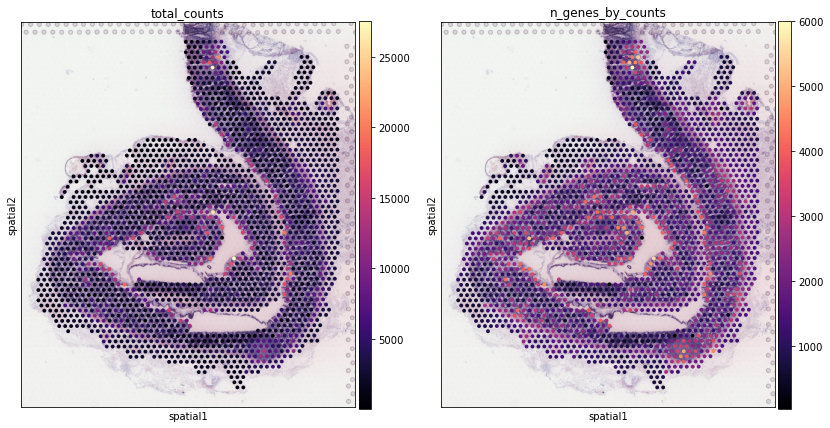

In [8]:
slide = select_slide(adata, 'A1')

with mpl.rc_context({'figure.figsize': [6,7],
                     'axes.facecolor': 'white'}):
    sc.pl.spatial(slide, img_key = "hires", cmap='magma', 
                  library_id=list(slide.uns['spatial'].keys())[0],
                  color=['total_counts', 'n_genes_by_counts'], size=1,
                  gene_symbols='SYMBOL', show=False, return_fig=True)

/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.
... storing 'Annotation' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


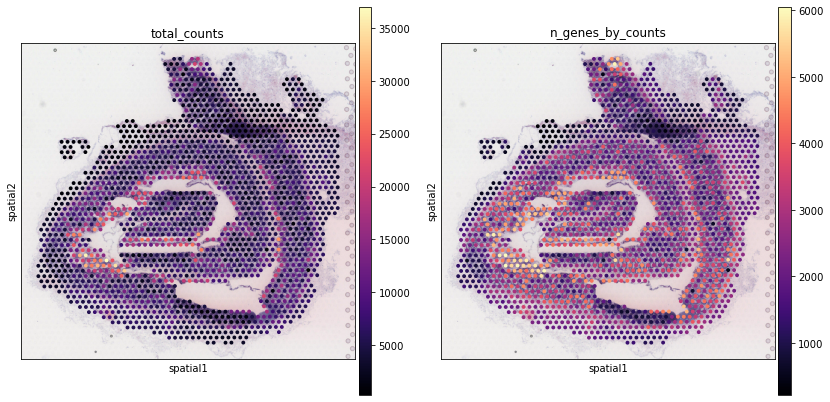

In [9]:
slide = select_slide(adata, 'A2')

with mpl.rc_context({'figure.figsize': [6,7],
                     'axes.facecolor': 'white'}):
    sc.pl.spatial(slide, img_key = "hires", cmap='magma', 
                  library_id=list(slide.uns['spatial'].keys())[0],
                  color=['total_counts', 'n_genes_by_counts'], size=1,
                  gene_symbols='SYMBOL', show=False, return_fig=True)

## Find regions determined by mLTO / LTi

/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Annotation' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


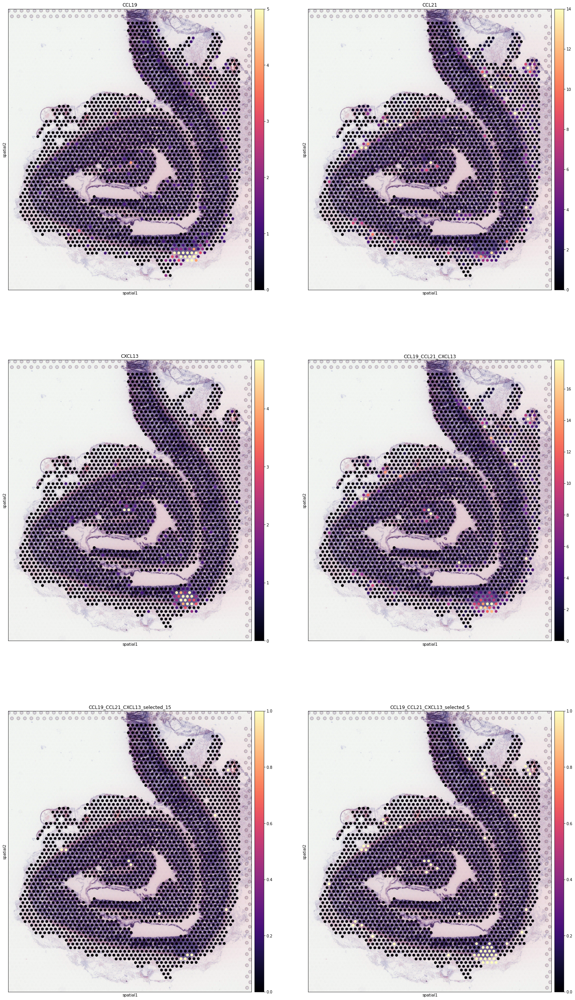

In [10]:
slide = select_slide(adata, 'A1')

with mpl.rc_context({'figure.figsize': [12,14],
                     'axes.facecolor': 'black'}):
    slide.obs["CCL19_CCL21_CXCL13"] = slide[:,slide.var['SYMBOL'].isin(["CCL19", "CCL21", "CXCL13"])].X.sum(1)
    slide.obs["CCL19_CCL21_CXCL13_selected_15"] = np.array(slide.obs["CCL19_CCL21_CXCL13"] > 15).astype(float)
    slide.obs["CCL19_CCL21_CXCL13_selected_5"] = np.array(slide.obs["CCL19_CCL21_CXCL13"] > 5).astype(float)
    sc.pl.spatial(slide, 
                  color=["CCL19", "CCL21", "CXCL13", "CCL19_CCL21_CXCL13", 
                         'CCL19_CCL21_CXCL13_selected_15', 'CCL19_CCL21_CXCL13_selected_5'], #img_key=None, size=1,
                  vmin=0, cmap='magma', vmax='p99.5',
                  ncols=2,
                  gene_symbols='SYMBOL'
                 )

/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Annotation' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


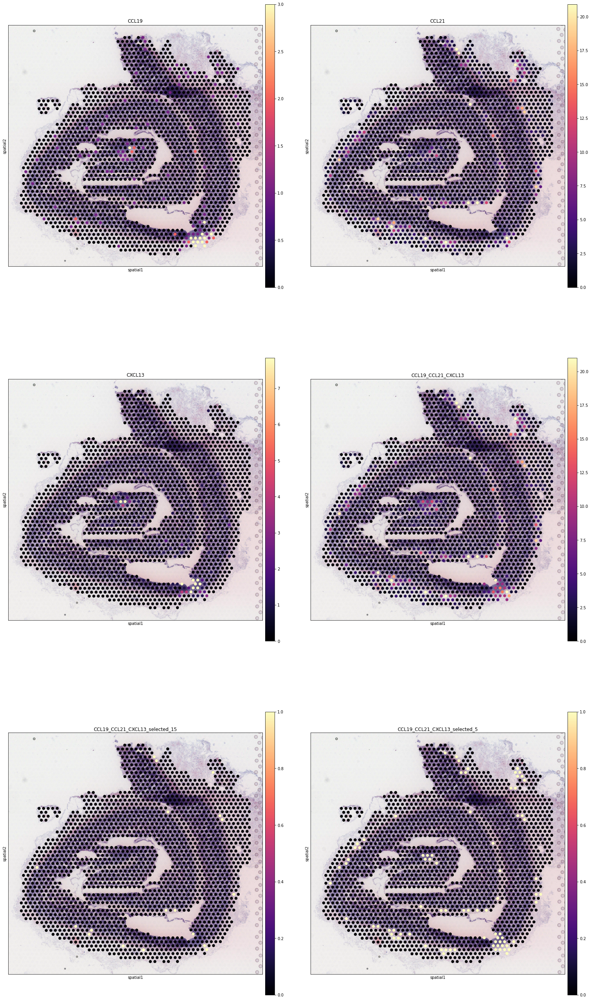

In [11]:
slide = select_slide(adata, 'A2')

with mpl.rc_context({'figure.figsize': [12,14],
                     'axes.facecolor': 'black'}):
    slide.obs["CCL19_CCL21_CXCL13"] = slide[:,slide.var['SYMBOL'].isin(["CCL19", "CCL21", "CXCL13"])].X.sum(1)
    slide.obs["CCL19_CCL21_CXCL13_selected_15"] = np.array(slide.obs["CCL19_CCL21_CXCL13"] > 15).astype(float)
    slide.obs["CCL19_CCL21_CXCL13_selected_5"] = np.array(slide.obs["CCL19_CCL21_CXCL13"] > 5).astype(float)
    sc.pl.spatial(slide, 
                  color=["CCL19", "CCL21", "CXCL13", "CCL19_CCL21_CXCL13", 
                         'CCL19_CCL21_CXCL13_selected_15', 'CCL19_CCL21_CXCL13_selected_5'], #img_key=None, size=1,
                  vmin=0, cmap='magma', vmax='p99.5',
                  ncols=2,
                  gene_symbols='SYMBOL'
                 )

/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.
... storing 'Annotation' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


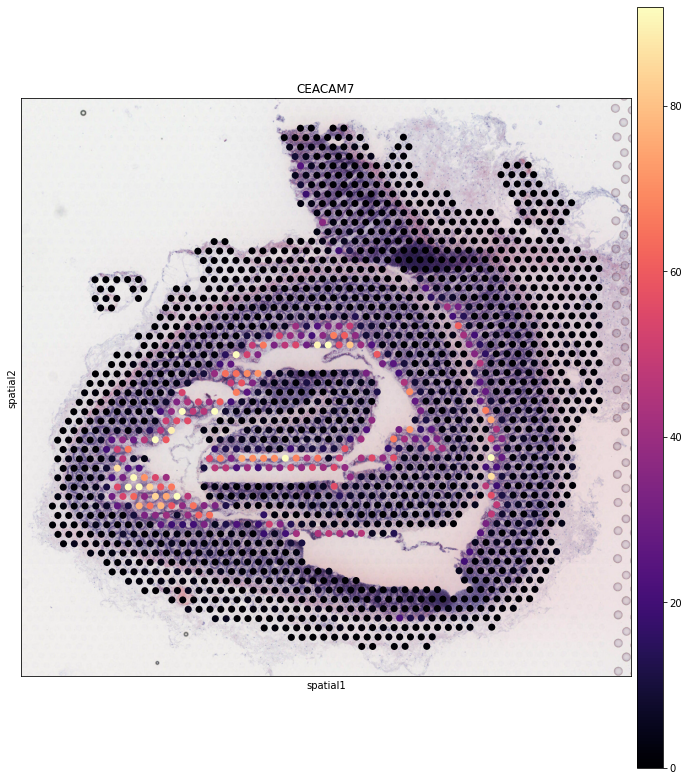

In [12]:
slide = select_slide(adata, 'A2')

with mpl.rc_context({'figure.figsize': [12,14],
                     'axes.facecolor': 'black'}):
    sc.pl.spatial(slide, 
                  color=["CEACAM7"], #img_key=None, size=1,
                  vmin=0, cmap='magma', vmax='p99.5',
                  ncols=2,
                  gene_symbols='SYMBOL'
                 )

Add counts matrix as `adata.raw` 

In [13]:
adata_vis = adata.copy()

In [14]:
def remove_special_characters(adata, special_list=[' ', '\(', '\)', '\+', '\\\\', '/', '-', '\.', ';'],
                              replace='_'):
    from re import sub
    for s in special_list:
        adata.var.columns = [sub(s, replace, c) for c in adata.var.columns]
        adata.obs.columns = [sub(s, replace, c) for c in adata.obs.columns]
        if adata.raw is not None:
            adata.raw.var.columns = [sub(s, replace, c) for c in adata.raw.var.columns]
            
    return adata



adata_vis_seu = adata_vis.copy()
adata_vis_seu = remove_special_characters(adata_vis_seu)
adata_vis_seu = remove_special_characters(adata_vis_seu, ['10X', '_10X'])
#adata_vis_seu.raw.var.drop(columns=adata_vis_seu.raw.var.columns, inplace=True)
adata_vis_seu.var_names = adata_vis_seu.var['SYMBOL']
adata_vis_seu.var.drop(columns=adata_vis_seu.var.columns, inplace=True)
adata_vis_seu.obs = adata_vis_seu.obs[['sample']]
del adata_vis_seu.obsm['mt']
del adata_vis_seu.obsp
del adata_vis_seu.uns
adata_vis_seu.write(f'{sp_data_folder}/sp_for_seurat_selected.h5ad')

In [15]:
adata_vis.raw = adata_vis

### Construct and examine UMAP of locations

Now we apply the standard scanpy processing pipeline to the spatial Visium data to show experiment to experiment variability in the data. Importatly, this workflow will show the extent of batch differences in your data (cell2location works on samples jointly, see below).

In this mouse brain dataset, only a few regions should be different between sections because we are using 2 samples from biological replicates sectioned at a slightly different location along the anterior-posterior axis in the mouse brain. We see general alighnment of locations from both experiments and some mismatches, but as you will see in the downstream analysis notebook most of the differences between experiments here come from batch effect, which cell2location can account for.

/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
... storing 'Annotation' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


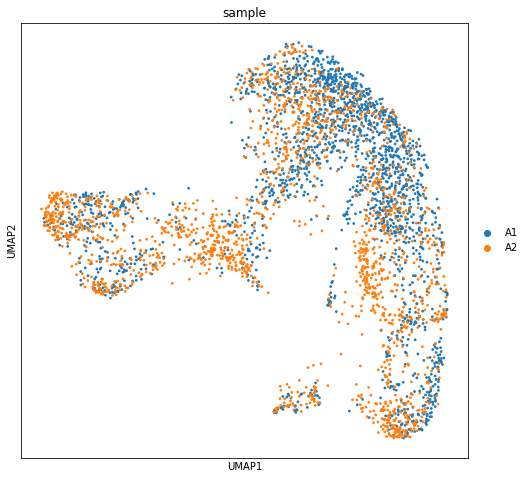

In [16]:
adata_vis_plt = adata_vis.copy()

# Log-transform (log(data + 1))
sc.pp.log1p(adata_vis_plt)

# Find highly variable genes within each sample
adata_vis_plt.var['highly_variable'] = False
for s in adata_vis_plt.obs['sample'].unique():
    
    adata_vis_plt_1 = adata_vis_plt[adata_vis_plt.obs['sample'].isin([s]), :]
    sc.pp.highly_variable_genes(adata_vis_plt_1, min_mean=0.0125, max_mean=5, min_disp=0.5, n_top_genes=1000)
    
    hvg_list = list(adata_vis_plt_1.var_names[adata_vis_plt_1.var['highly_variable']])
    adata_vis_plt.var.loc[hvg_list, 'highly_variable'] = True
    
# Scale the data ( (data - mean) / sd )
sc.pp.scale(adata_vis_plt, max_value=10)
# PCA, KNN construction, UMAP
sc.tl.pca(adata_vis_plt, svd_solver='arpack', n_comps=40, use_highly_variable=True)
sc.pp.neighbors(adata_vis_plt, n_neighbors = 20, n_pcs = 40, metric='cosine')
sc.tl.umap(adata_vis_plt, min_dist = 0.3, spread = 1)

with mpl.rc_context({'figure.figsize': [8, 8],
                     'axes.facecolor': 'white'}):
    sc.pl.umap(adata_vis_plt, color=['sample'], size=30,
               color_map = 'RdPu', ncols = 1, #legend_loc='on data',
               legend_fontsize=10)

## 3. Load reference cell type signature from snRNA-seq data and show UMAP of cells <a name="3.-Load-reference-cell-type-signature-from-snRNA-seq-data-and-show-UMAP-of-cells"></a>

Next, we load the pre-processed snRNAseq reference anndata object that contains estimated expression signatures of reference cell types (see notebook 1/3).

In [19]:
## snRNAseq reference (raw counts)
adata_snrna_raw = sc.read(f'{reg_path}sc.h5ad')

adata_snrna_raw2 = anndata.read_h5ad(sc_data_folder + "FINAL_OBJECT_raw_nosoupx.h5ad")
adata_snrna_raw.obsm = adata_snrna_raw2[adata_snrna_raw.obs_names,:].obsm

/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Export reference expression signatures of cell types:

In [20]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_snrna_raw.varm.keys():
    inf_aver = adata_snrna_raw.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}' 
                                    for i in adata_snrna_raw.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_snrna_raw.var[[f'means_per_cluster_mu_fg_{i}' 
                                    for i in adata_snrna_raw.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_snrna_raw.uns['mod']['factor_names']
inf_aver.iloc[0:5, 0:5]

,Activated CD4 T,Activated CD8 T,Adult Glia,BEST2+ Goblet cell,BEST4+ epithelial
ENSG00000187634,0.000336,0.000216,0.002801,0.000614,0.000455
ENSG00000188976,0.051101,0.064992,0.017697,0.180101,0.117636
ENSG00000187583,0.000641,0.008324,0.001639,0.001479,0.000685
ENSG00000188290,0.022356,0.028610,0.028883,0.053030,1.035190
ENSG00000187608,0.086353,0.156246,0.049796,0.066618,0.512312


Quick look at the cell type composition in our reference data in UMAP coordinates (UMAP representation was generated using a standard scanpy workflow, see notebook 1/3).

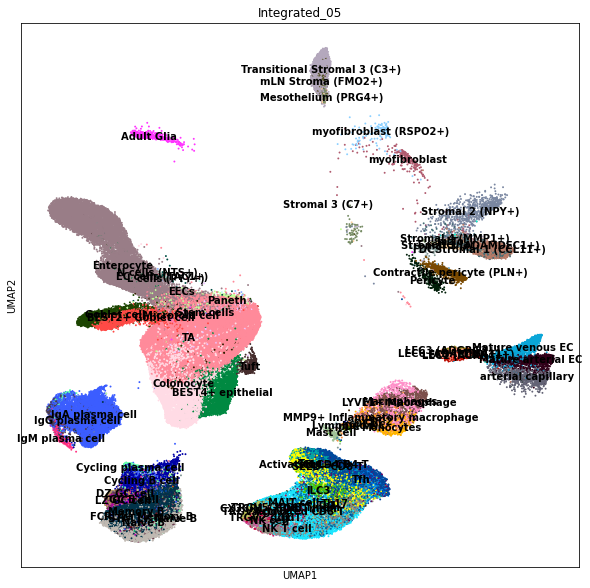

In [21]:
with mpl.rc_context({'figure.figsize': [10, 10],
                     'axes.facecolor': 'white'}):
    sc.pl.umap(adata_snrna_raw, color=['Integrated_05'], size=15,
               color_map = 'RdPu', ncols = 1, legend_loc='on data',
               legend_fontsize=10)

### Run NNLS-autogenes <a class="anchor" id="NNLS-autogenes"></a>

In [22]:
# choose genes shared between datasets
ind = adata_vis.var_names[adata_vis.var_names.isin(inf_aver.index)]
inf_aver = inf_aver.loc[ind, :]

In [23]:
results_folder+f'autogenes_models/'

'/nfs/team205/vk7/sanger_projects/collaborations/fetal_gut_mapping/results/oxford/autogenes_models/'

gen	nevals	pareto	correlation      	distance               
0  	100   	1     	1797.31 - 1797.31	2700211.48 - 2700211.48
1  	100   	1     	1797.31 - 1797.31	2700211.48 - 2700211.48


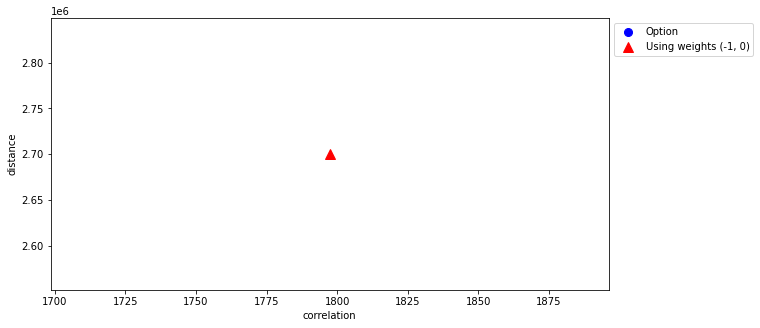

1.5564362486203511 min
0.02779453992843628 min


In [25]:
import autogenes as ag
import time

# Select all genes - just use the regression models
#adata_snrna_raw.var['selected'] = True

# Initialise autogenes object
#ag.init(adata_snrna_raw, genes_key='selected', celltype_key='annotation_1')
averages = inf_aver.copy() #cell2location.cluster_averages.get_cluster_averages(adata_snrna_raw, 'annotation_1')
ag.init(averages.T)
# do not run the gene selection
ag.optimize(ngen=1,nfeatures=averages.shape[0],seed=0, mode='fixed')
ag.plot(weights=(-1,0))

adata_vis_sel = anndata.AnnData(X=adata_vis.raw[:, adata_vis.raw.var_names.isin(averages.index)].X)
adata_vis_sel.var_names = adata_vis.raw.var_names[adata_vis.raw.var_names.isin(averages.index)]
adata_vis_sel.obs_names = adata_vis.raw.obs_names

# Deconvolve spatial data into single cell averages
start = time.time()
coef_nnls = ag.deconvolve(adata_vis_sel[:, averages.index].X.toarray(), #key='selected',
                          model='nnls')
print(str((time.time() - start) / 60) + ' min')

start = time.time()
coef_linear = ag.deconvolve(adata_vis_sel[:, averages.index].X.toarray(), #key='selected',
                            model='linear')
print(str((time.time() - start) / 60) + ' min')

#start = time.time()
#coef_nusvr = ag.deconvolve(adata_vis.raw.X.toarray(), #key='selected',
#                           model='nusvr')
#str((time.time() - start) / 60) + ' min'

# save results to DF
coef_nnls_df = pd.DataFrame(coef_nnls.T, columns=adata_vis.obs_names, index=averages.columns)
#coef_nusvr_df = pd.DataFrame(coef_nusvr, columns=adata_vis.obs_names, index=averages.columns)
coef_linear_df = pd.DataFrame(coef_linear.T, columns=adata_vis.obs_names, index=averages.columns)

# write to disc
coef_nnls_df.to_csv(results_folder + f'autogenes_models/coef_nnls_selected_seed.csv')
#coef_nusvr_df.to_csv(results_folder + 'autogenes_models/coef_nusvr_seed.csv')
coef_linear_df.to_csv(results_folder + f'autogenes_models/coef_linear_selected_seed.csv')

In [26]:
coef_nnls_df

spot_id,A1_AAACAAGTATCTCCCA-1,A1_AAACAGAGCGACTCCT-1,A1_AAACATTTCCCGGATT-1,A1_AAACCACTACACAGAT-1,A1_AAACCCGAACGAAATC-1,A1_AAACCGGGTAGGTACC-1,A1_AAACCGTTCGTCCAGG-1,A1_AAACGAGACGGTTGAT-1,A1_AAACGGGCGTACGGGT-1,A1_AAACGTGTTCGCCCTA-1,...,A2_TTGTAATCCGTACTCG-1,A2_TTGTATCACACAGAAT-1,A2_TTGTGCAGCCACGTCA-1,A2_TTGTGGTAGGAGGGAT-1,A2_TTGTGGTGGTACTAAG-1,A2_TTGTGTATGCCACCAA-1,A2_TTGTGTTTCCCGAAAG-1,A2_TTGTTGTGTGTCAAGA-1,A2_TTGTTTCACATCCAGG-1,A2_TTGTTTCCATACAACT-1
Activated CD4 T,0.000000,0.000000,0.060715,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Activated CD8 T,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Adult Glia,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BEST2+ Goblet cell,0.023691,0.022452,0.000000,0.007567,0.026543,0.081073,0.010028,0.026792,0.024558,0.02149,...,0.02492,0.047763,0.023027,0.072304,0.016984,0.047159,0.048831,0.055718,0.122089,0.021207
BEST4+ epithelial,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mLN Stroma (FMO2+),0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
mLTo,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
myofibroblast,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
myofibroblast (RSPO2+),0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [28]:
import pandas as pd
adata_vis.obsm["decomposition"] = coef_nnls_df.T
for ct in adata_vis.obsm["decomposition"].columns:
    adata_vis.obs[ct] = adata_vis.obsm["decomposition"][ct]
    
adata_vis.write(f"{results_folder}autogenes_models/sp_20k_released.h5ad")

... storing 'Annotation' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


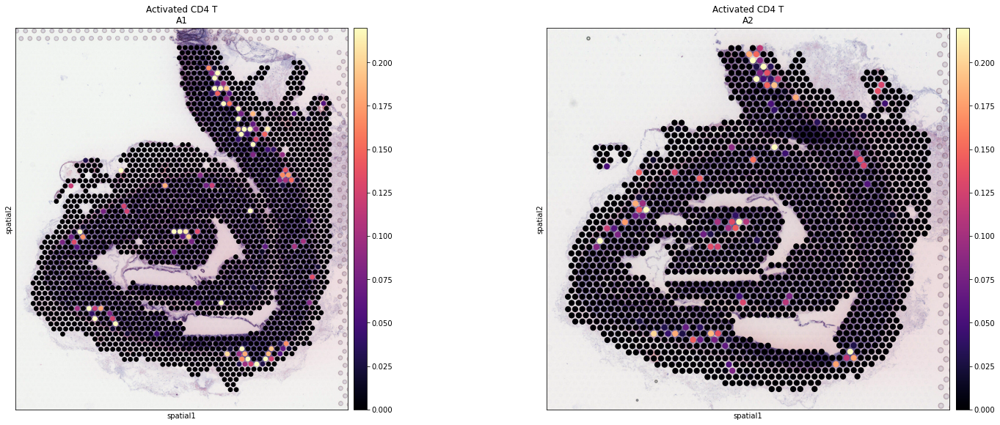

In [36]:
def plot_spatial_per_cell_type(adata, 
                               cell_type=adata_vis.obsm["decomposition"].columns,
                               samples=['A1', 'A2'],
                              ncol=2):
    n_samples = len(samples)
    nrow = int(np.ceil(n_samples / ncol))
    fig, axs = plt.subplots(nrow, ncol, figsize=(24, 8))
    if nrow == 1:
        axs = axs.reshape((1, ncol))
    
    col_name = f'{cell_type}'
    vmax = np.quantile(adata_vis.obs[col_name].values, 0.992)
    #adata_vis.obs[cell_type] = adata_vis.obs[col_name].copy()
    
    from itertools import chain
    ind = list(chain(*[[(i, j) for i in range(nrow)] for j in range(ncol)]))
    
    for i, s in enumerate(samples):
        sp_data_s = select_slide(adata, s, s_col='sample')
        sc.pl.spatial(sp_data_s, cmap='magma',
                      color=cell_type, 
                      size=1.3, img_key='hires', alpha_img=1,
                      vmin=0, vmax=vmax, ax=axs[ind[i][0],ind[i][1]], show=False
                                            )
        axs[ind[i][0],ind[i][1]].title.set_text(cell_type+'\n'+s)
        
    fig.tight_layout(pad=0.5)
        
    return fig

plot_spatial_per_cell_type(adata_vis, cell_type=adata_vis.obsm["decomposition"].columns[0]);

In [30]:
import os
with mpl.rc_context({"axes.facecolor": "black"}):
    clust_names = adata_vis.obsm["decomposition"].columns
    
    for s in adata_vis.obs['sample'].unique():

        s_ind = adata_vis.obs['sample'] == s
        s_keys = list(adata_vis.uns['spatial'].keys())
        s_spatial = np.array(s_keys)[[s in i for i in s_keys]][0]

        fig = sc.pl.spatial(adata_vis[s_ind, :], cmap='magma',
                            color=clust_names, ncols=5, library_id=s_spatial,
                            size=1.3, img_key='hires', alpha_img=1,
                            vmin=0, vmax='p99.2',
                            return_fig=True, show=False)
        
        fig_dir = f"{results_folder}/autogenes_models/spatial/"
        if not os.path.exists(fig_dir):
            os.mkdir(fig_dir)
        fig_dir = f"{results_folder}/autogenes_models/spatial/per_sample/"
        if not os.path.exists(fig_dir):
            os.mkdir(fig_dir)

        plt.savefig(f"{fig_dir}W_cell_abundance_q05_{s}.png",
                    bbox_inches='tight')
        plt.close()

/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [31]:
decomposition = adata_vis.obs[adata_vis.obsm["decomposition"].columns]
decomposition = (decomposition.T / decomposition.sum(1)).T
adata_vis.obs.loc[:, adata_vis.obsm["decomposition"].columns] = decomposition

with mpl.rc_context({"axes.facecolor": "black"}):
    clust_names = adata_vis.obsm["decomposition"].columns
    
    for s in adata_vis.obs['sample'].unique():

        s_ind = adata_vis.obs['sample'] == s
        s_keys = list(adata_vis.uns['spatial'].keys())
        s_spatial = np.array(s_keys)[[s in i for i in s_keys]][0]

        fig = sc.pl.spatial(adata_vis[s_ind, :], cmap='magma',
                            color=clust_names, ncols=5, library_id=s_spatial,
                            size=1.3, img_key='hires', alpha_img=1,
                            vmin=0, vmax='p99.2',
                            return_fig=True, show=False)
        
        fig_dir = f"{results_folder}/autogenes_models/spatial/"
        if not os.path.exists(fig_dir):
            os.mkdir(fig_dir)
        fig_dir = f"{results_folder}/autogenes_models/spatial/per_sample/"
        if not os.path.exists(fig_dir):
            os.mkdir(fig_dir)

        plt.savefig(f"{fig_dir}W_cell_proportion_{s}.png",
                    bbox_inches='tight')
        plt.close()

/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


## 4. Automatic discrete region identification by clustering cell densities
We find regions by clustering spots based on inferred molecule contributions of each cell type. We use leiden clustering that incorporates both the similarity of spots in cell locations and in their proximity, by including both when computing the KNN graph. Results are saved in `adata_vis.obs['leiden']`. Since the clustering is done jointly, the cluster identities match between sections.

In [32]:
# compute KNN using the cell2location output
sc.pp.neighbors(adata_vis, use_rep='decomposition',
                n_neighbors = 20, metric='correlation')

# Cluster spots into regions using scanpy
sc.tl.leiden(adata_vis, resolution=0.7)

adata_vis.obs["region_cluster"] = adata_vis.obs["leiden"]
adata_vis.obs["region_cluster"] = adata_vis.obs["region_cluster"].astype("category")


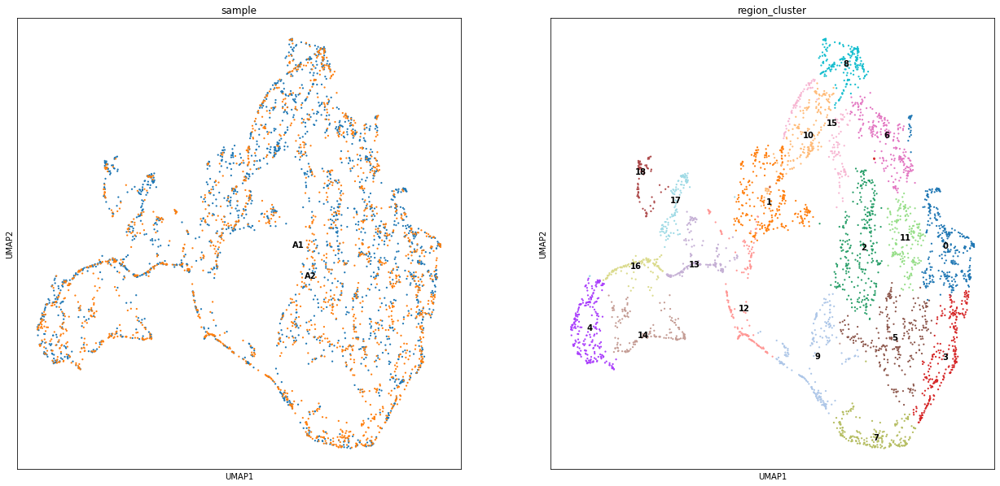

In [33]:
sc.tl.umap(adata_vis, min_dist = 0.2, spread = 1.5)

sc.settings.figdir = f"{results_folder}/autogenes_models/"

#del adata_vis.uns['region_cluster_colors']

rcParams['figure.figsize'] = 10, 10
rcParams["axes.facecolor"] = "white"
sc.pl.umap(adata_vis, color=['sample', 'region_cluster'],
           color_map = 'RdPu', ncols = 2, legend_loc='on data',
           legend_fontsize=10, size=20, save='umap_region_cluster.pdf')

/nfs/team283/vk7/software/miniconda3farm5/envs/pyro160/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


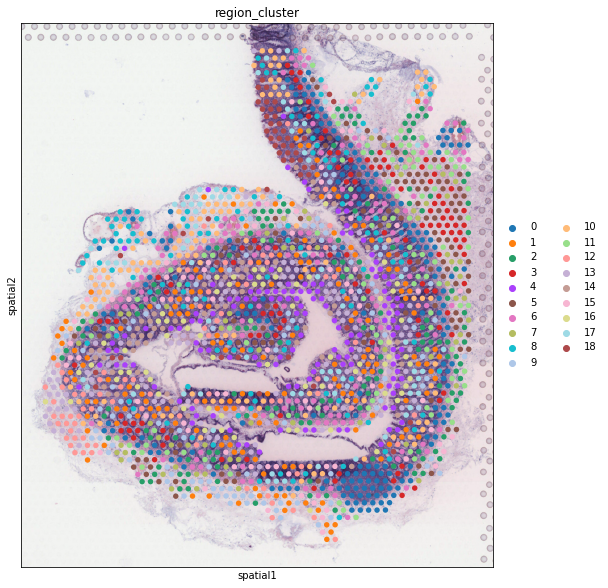

Trying to set attribute `.uns` of view, copying.


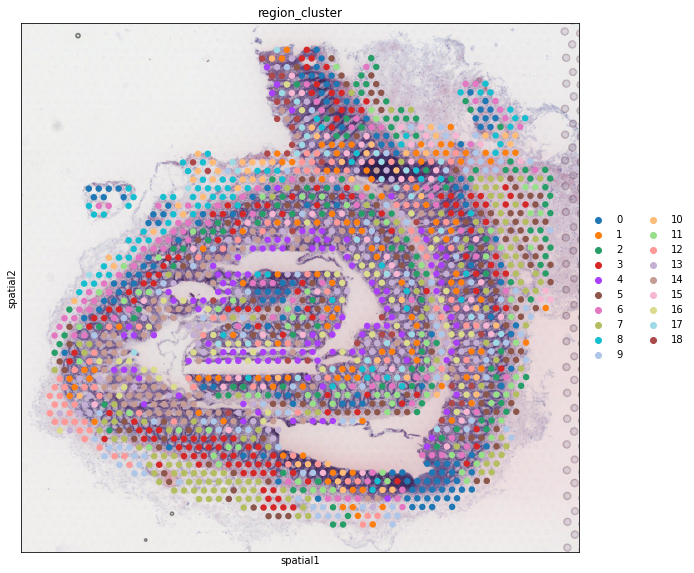

In [34]:
# Plot locations of clusters
rcParams["figure.figsize"] = [10, 10]
rcParams["axes.facecolor"] = "white"

for s in list(adata_vis.obs["sample"].unique()):
    slide = select_slide(adata_vis, s)
    sel_clust = adata_vis.obs['region_cluster'].cat.categories.isin(slide.obs['region_cluster'].cat.categories)
    slide.uns['region_cluster_colors'] = list(np.array(adata_vis.uns['region_cluster_colors'])[sel_clust])
    sc.pl.spatial(slide, #library_id=s,
                  color=["region_cluster"], img_key='hires', size=1,
                  #palette=adata_vis.uns['region_cluster_colors']
                );

### Export regions for import to 10X Loupe Browser
# add binary labels for each region
region_cluster_bin = adata_vis.obs[['region_cluster']]
# save maps for each sample separately
sam = np.array(adata_vis.obs['sample'])

for i in np.unique(sam):
    
    s1 = region_cluster_bin
    s1 = s1.loc[sam == i]
    s1.index = [x[10:] for x in s1.index]
    s1.index.name = 'Barcode'
    
    s1.to_csv(f"{results_folder}/autogenes_models/"\
              +'/region_cluster29_' + i + '.csv')

## 6. Identify co-occuring cell type combinations using matrix factorisation

Here we use inferred cell densities as input to non-negative matrix factorisation to identify co-occuring cell type combinations.

Modules and their versions used for this analysis

In [35]:
import sys
for module in sys.modules:
    try:
        print(module,sys.modules[module].__version__)
    except:
        try:
            if  type(sys.modules[module].version) is str:
                print(module,sys.modules[module].version)
            else:
                print(module,sys.modules[module].version())
        except:
            try:
                print(module,sys.modules[module].VERSION)
            except:
                pass

sys 3.7.10 | packaged by conda-forge | (default, Feb 19 2021, 16:07:37) 
[GCC 9.3.0]
ipykernel 5.5.3
ipykernel._version 5.5.3
json 2.0.9
re 2.2.1
IPython 7.22.0
IPython.core.release 7.22.0
logging 0.5.1.2
zlib 1.0
traitlets 5.0.5
traitlets._version 5.0.5
argparse 1.1
ipython_genutils 0.2.0
ipython_genutils._version 0.2.0
platform 1.0.8
IPython.core.crashhandler 7.22.0
pygments 2.8.1
pexpect 4.8.0
ptyprocess 0.7.0
decorator 5.0.6
pickleshare 0.7.5
backcall 0.2.0
sqlite3 2.6.0
sqlite3.dbapi2 2.6.0
_sqlite3 2.6.0
prompt_toolkit 3.0.18
wcwidth 0.2.5
jedi 0.18.0
parso 0.8.2
colorama 0.4.4
ctypes 1.1.0
_ctypes 1.1.0
IPython.core.magics.code 7.22.0
urllib.request 3.7
jupyter_client 6.1.12
jupyter_client._version 6.1.12
zmq 22.0.3
zmq.backend.cython 40304
zmq.backend.cython.constants 40304
zmq.sugar 22.0.3
zmq.sugar.constants 40304
zmq.sugar.version 22.0.3
jupyter_core 4.7.1
jupyter_core.version 4.7.1
tornado 6.1
_curses b'2.2'
dateutil 2.8.1
dateutil._version 2.8.1
six 1.15.0
decimal 1.70
_de